In [1]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# We will use the Seaborn library
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [3]:

DATA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [5]:
df = pd.read_csv(DATA_URL + "telecom_churn.csv")

In [7]:
df.head()


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


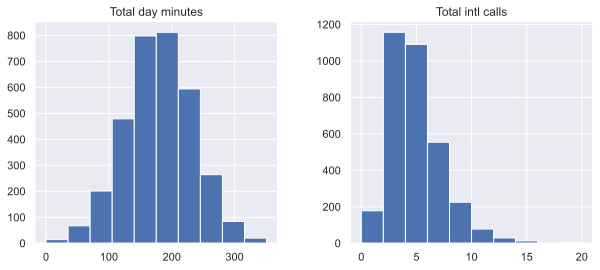

In [9]:
features = ["Total day minutes", "Total intl calls"]
df[features].hist(figsize=(10, 4));

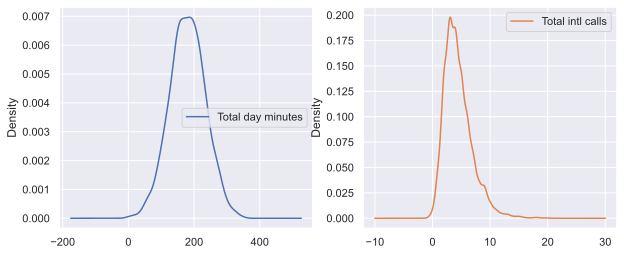

In [11]:
df[features].plot(
    kind="density", subplots=True, layout=(1, 2), sharex=False, figsize=(10, 4)
);

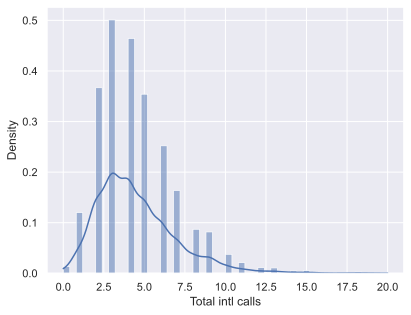

In [13]:
sns.histplot(df["Total intl calls"], kde=True, stat="density");

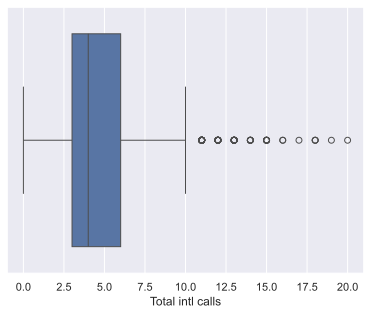

In [15]:
sns.boxplot(x="Total intl calls", data=df);

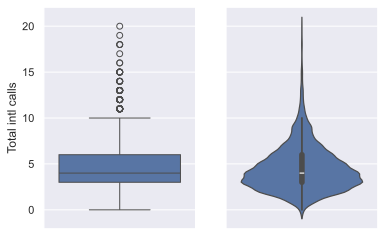

In [17]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(6, 4))
sns.boxplot(data=df["Total intl calls"], ax=axes[0])
sns.violinplot(data=df["Total intl calls"], ax=axes[1]);

In [19]:
df[features].describe()

,Total day minutes,Total intl calls
count,3333.000000,3333.000000
mean,179.775098,4.479448
std,54.467389,2.461214
min,0.000000,0.000000
25%,143.700000,3.000000
50%,179.400000,4.000000
75%,216.400000,6.000000
max,350.800000,20.000000


In [21]:
df["Churn"].value_counts()

Churn
False    2850
True      483
Name: count, dtype: int64

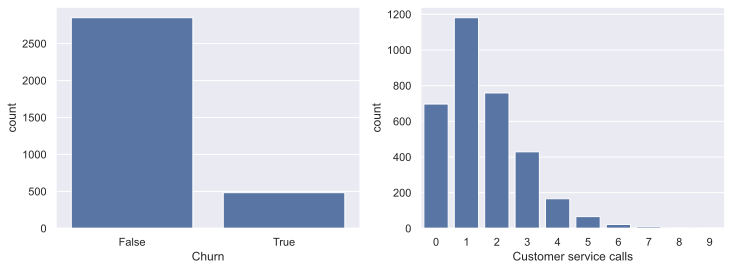

In [23]:
_, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

sns.countplot(x="Churn", data=df, ax=axes[0])
sns.countplot(x="Customer service calls", data=df, ax=axes[1]);

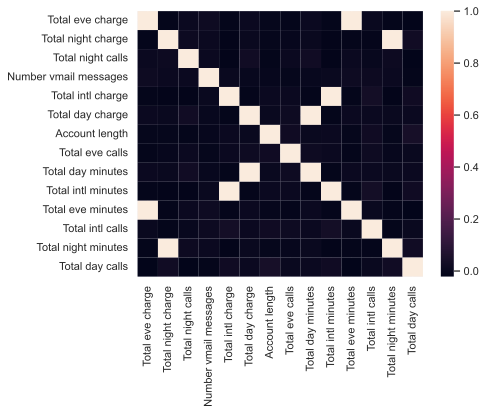

In [25]:
# Drop non-numerical variables
numerical = list(
    set(df.columns)
    - set(
        [
            "State",
            "International plan",
            "Voice mail plan",
            "Area code",
            "Churn",
            "Customer service calls",
        ]
    )
)

# Calculate and plot
corr_matrix = df[numerical].corr()
sns.heatmap(corr_matrix);

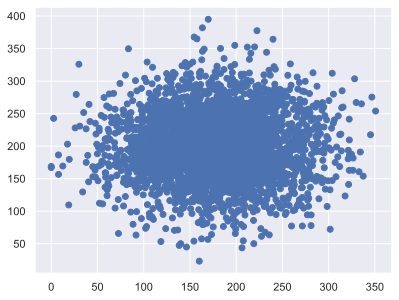

In [27]:
plt.scatter(df["Total day minutes"], df["Total night minutes"]);

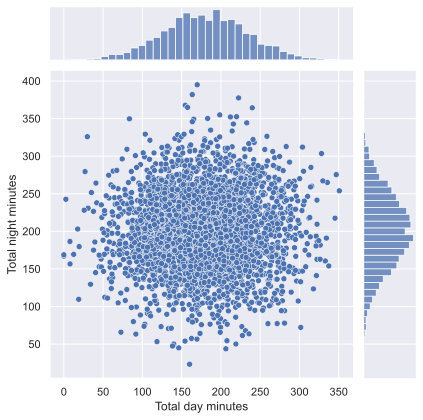

In [29]:
sns.jointplot(x="Total day minutes", y="Total night minutes", data=df, kind="scatter");

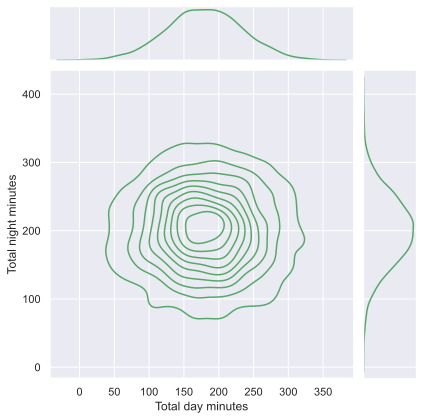

In [31]:
sns.jointplot(
    x="Total day minutes", y="Total night minutes", data=df, kind="kde", color="g"
);

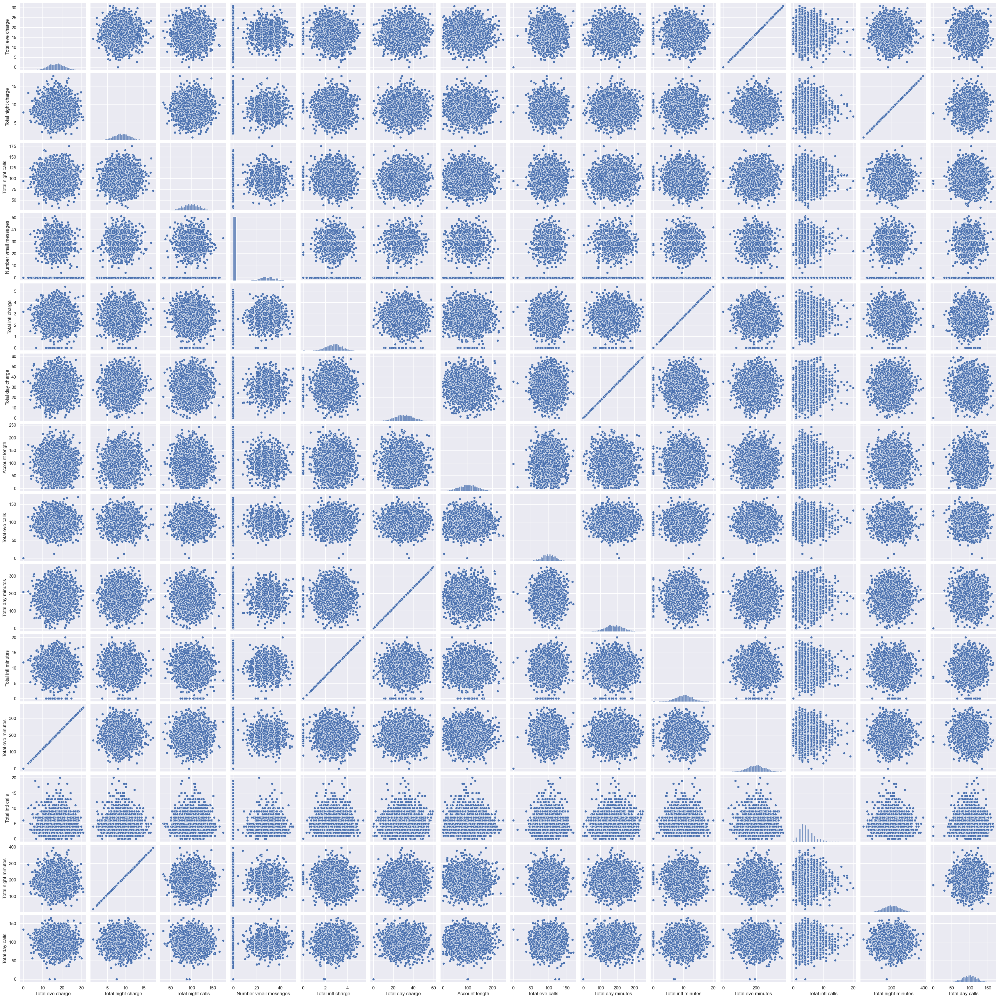

In [36]:
# `pairplot()` may become very slow with the SVG format
%config InlineBackend.figure_format = 'png'
sns.pairplot(df[numerical]);

In [37]:
%config InlineBackend.figure_format = 'svg'

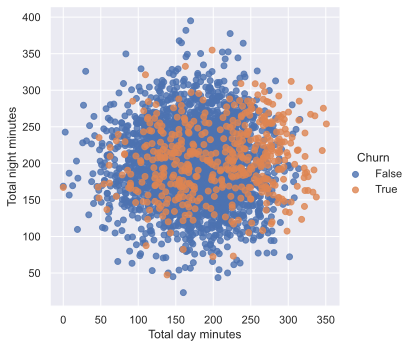

In [38]:
sns.lmplot(
    x="Total day minutes", y="Total night minutes", data=df, hue="Churn", fit_reg=False
);

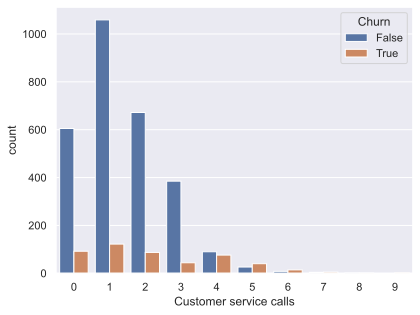

In [42]:
sns.countplot(x="Customer service calls", hue="Churn", data=df);

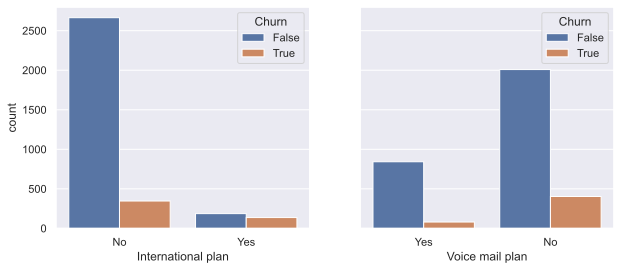

In [44]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.countplot(x="International plan", hue="Churn", data=df, ax=axes[0])
sns.countplot(x="Voice mail plan", hue="Churn", data=df, ax=axes[1]);

In [46]:
pd.crosstab(df["State"], df["Churn"]).T

State,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
Churn,,,,,,,,,,,,,,,,,,,,,
False,49,72,44,60,25,57,62,49,52,55,...,52,48,54,62,72,65,52,71,96,68
True,3,8,11,4,9,9,12,5,9,8,...,8,5,18,10,5,8,14,7,10,9


In [48]:
df.groupby(["State"])["Churn"].agg(["mean"]).sort_values(by="mean", ascending=False).T

State,NJ,CA,TX,MD,SC,MI,MS,NV,WA,ME,...,RI,WI,IL,NE,LA,IA,VA,AZ,AK,HI
mean,0.264706,0.264706,0.25,0.242857,0.233333,0.219178,0.215385,0.212121,0.212121,0.209677,...,0.092308,0.089744,0.086207,0.081967,0.078431,0.068182,0.064935,0.0625,0.057692,0.056604


In [50]:
# Matplotlib forms basis for visualization in Python
import matplotlib.pyplot as plt

# We will use the Seaborn library
import seaborn as sns

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

# Increase the default plot size and set the color scheme
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["image.cmap"] = "viridis"
import pandas as pd

In [52]:
# for Jupyter-book, we copy data from GitHub, locally, to save Internet traffic,
# you can specify the data/ folder from the root of your cloned
# https://github.com/Yorko/mlcourse.ai repo, to save Internet traffic
DATAA_URL = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [54]:
df = pd.read_csv(DATAA_URL + "video_games_sales.csv").dropna()
print(df.shape)

(6825, 16)


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   float64
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   float64
 12  User_Score       6825 non-null   object 
 13  User_Count       6825 non-null   float64
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(9), object(7)
memory usage: 906.4+ KB


In [58]:
df["User_Score"] = df["User_Score"].astype("float64")
df["Year_of_Release"] = df["Year_of_Release"].astype("int64")
df["User_Count"] = df["User_Count"].astype("int64")
df["Critic_Count"] = df["Critic_Count"].astype("int64")

In [60]:
useful_cols = [
    "Name",
    "Platform",
    "Year_of_Release",
    "Genre",
    "Global_Sales",
    "Critic_Score",
    "Critic_Count",
    "User_Score",
    "User_Count",
    "Rating",
]
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006,Sports,82.53,76.0,51,8.0,322,E
2,Mario Kart Wii,Wii,2008,Racing,35.52,82.0,73,8.3,709,E
3,Wii Sports Resort,Wii,2009,Sports,32.77,80.0,73,8.0,192,E
6,New Super Mario Bros.,DS,2006,Platform,29.80,89.0,65,8.5,431,E
7,Wii Play,Wii,2006,Misc,28.92,58.0,41,6.6,129,E


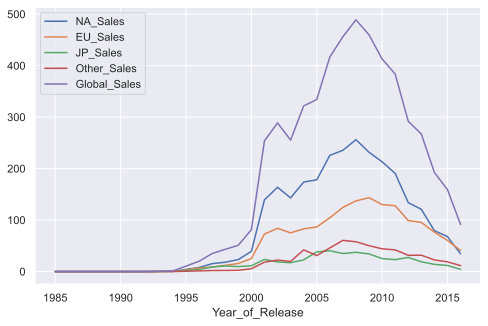

In [62]:
df[[x for x in df.columns if "Sales" in x] + ["Year_of_Release"]].groupby(
    "Year_of_Release"
).sum().plot();

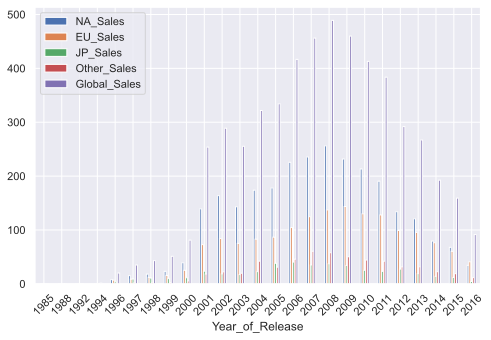

In [64]:
df[[x for x in df.columns if "Sales" in x] + ["Year_of_Release"]].groupby(
    "Year_of_Release"
).sum().plot(kind="bar", rot=45);

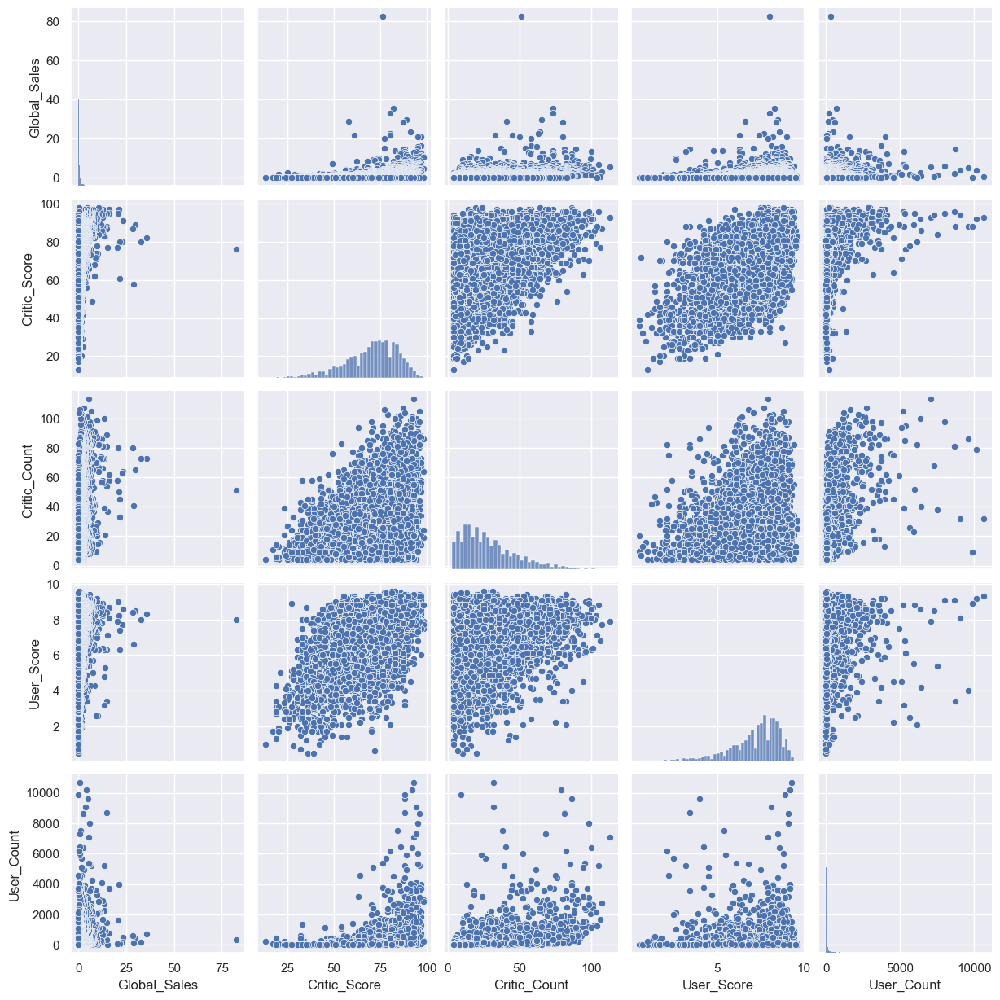

In [66]:
# `pairplot()` may become very slow with the SVG format
%config InlineBackend.figure_format = 'png'
sns.pairplot(
    df[["Global_Sales", "Critic_Score", "Critic_Count", "User_Score", "User_Count"]]
);

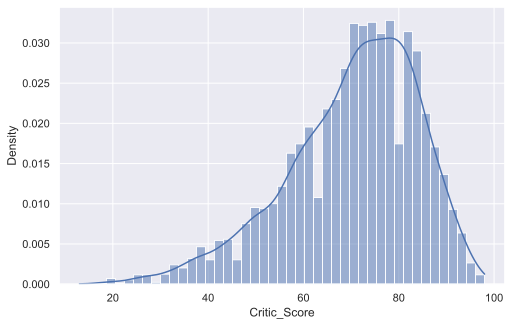

In [68]:
%config InlineBackend.figure_format = 'svg'
sns.histplot(df["Critic_Score"], kde=True, stat="density");

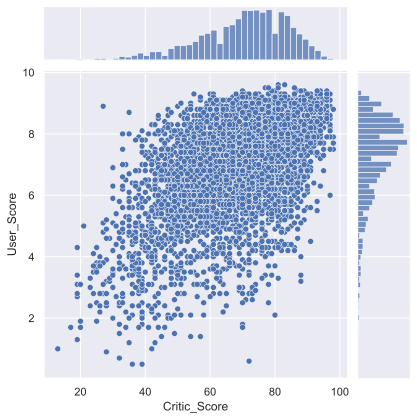

In [70]:
sns.jointplot(x="Critic_Score", y="User_Score", data=df, kind="scatter");

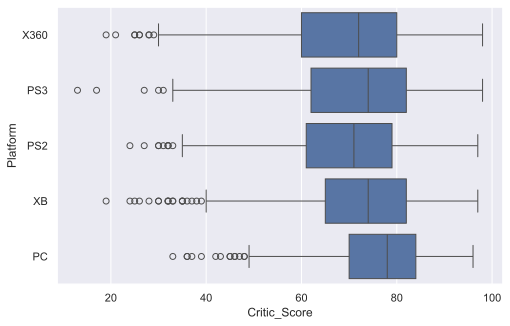

In [72]:
top_platforms = (
    df["Platform"].value_counts().sort_values(ascending=False).head(5).index.values
)
sns.boxplot(
    y="Platform",
    x="Critic_Score",
    data=df[df["Platform"].isin(top_platforms)],
    orient="h",
);

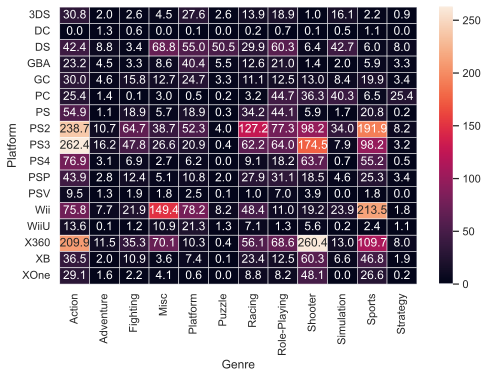

In [74]:
platform_genre_sales = (
    df.pivot_table(
        index="Platform", columns="Genre", values="Global_Sales", aggfunc="sum"
    )
    .fillna(0)
    .map(float)
)
sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=0.5);

In [84]:
# Tune the visual settings for figures in `seaborn`
sns.set_context(
    "notebook", font_scale=1.5, rc={"figure.figsize": (11, 8), "axes.titlesize": 18}
)

from matplotlib import rcParams

rcParams["figure.figsize"] = 11, 8

In [86]:
# for Jupyter-book, we copy data from GitHub, locally, to save Internet traffic,
# you can specify the data/ folder from the root of your cloned
# https://github.com/Yorko/mlcourse.ai repo, to save Internet traffic
DATAAA_PATH = "https://raw.githubusercontent.com/Yorko/mlcourse.ai/main/data/"

In [92]:
dataFrame = pd.read_csv(DATAAA_PATH + "mlbootcamp5_train.csv", sep=";")
print("Dataset size: ", dataFrame.shape)
dataFrame.head()

Dataset size:  (70000, 13)


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


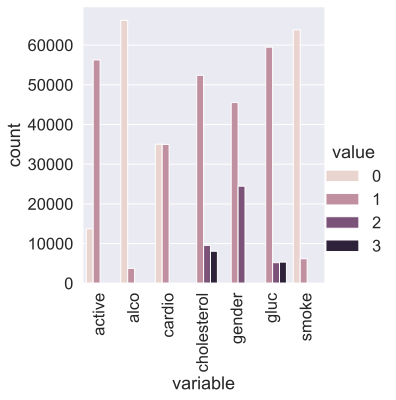

In [96]:
df_uniques = pd.melt(
    frame=dataFrame,
    value_vars=["gender", "cholesterol", "gluc", "smoke", "alco", "active", "cardio"],
)
df_uniques = (
    pd.DataFrame(df_uniques.groupby(["variable", "value"])["value"].count())
    .sort_index(level=[0, 1])
    .rename(columns={"value": "count"})
    .reset_index()
)

sns.catplot(
    x="variable", y="count", hue="value", data=df_uniques, kind="bar"
)
plt.xticks(rotation='vertical');

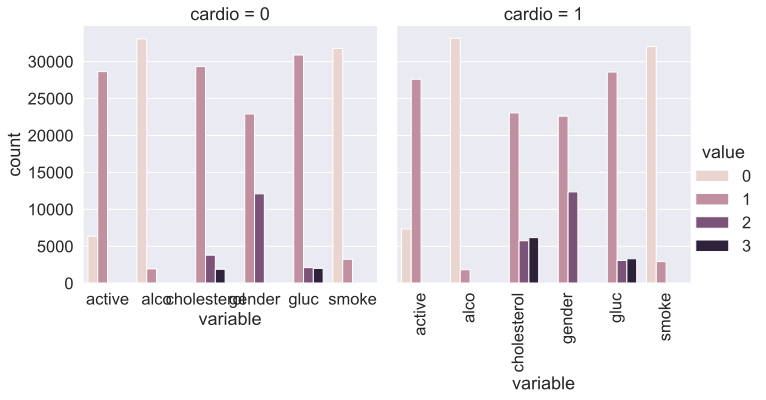

In [98]:
df_uniques = pd.melt(
    frame=dataFrame,
    value_vars=["gender", "cholesterol", "gluc", "smoke", "alco", "active"],
    id_vars=["cardio"],
)
df_uniques = (
    pd.DataFrame(df_uniques.groupby(["variable", "value", "cardio"])["value"].count())
    .sort_index(level=[0, 1])
    .rename(columns={"value": "count"})
    .reset_index()
)

sns.catplot(
    x="variable",
    y="count",
    hue="value",
    col="cardio",
    data=df_uniques,
    kind="bar",
)
plt.xticks(rotation='vertical');

In [100]:
for c in df.columns:
    n = df[c].nunique()
    print(c)
    if n <= 3:
        print(n, sorted(df[c].value_counts().to_dict().items()))
    else:
        print(n)
    print(10 * "-")

Name
4377
----------
Platform
17
----------
Year_of_Release
25
----------
Genre
12
----------
Publisher
262
----------
NA_Sales
351
----------
EU_Sales
273
----------
JP_Sales
157
----------
Other_Sales
144
----------
Global_Sales
536
----------
Critic_Score
81
----------
Critic_Count
106
----------
User_Score
89
----------
User_Count
875
----------
Developer
1289
----------
Rating
7
----------


In [104]:
#Question 1.1. (1 point). How many men and women are present in this dataset? Values of the gender feature were not given 
#(whether “1” stands for women or for men) – figure this out by looking analyzing height, making the assumption that men are taller 
#on average.



In [106]:
dataFrame.gender

0        2
1        1
2        1
3        2
4        1
        ..
69995    2
69996    1
69997    2
69998    1
69999    1
Name: gender, Length: 70000, dtype: int64

In [108]:
dataFrame.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [124]:
dataFrame[['gender','height']].head(20)

,gender,height
0,2,168
1,1,156
2,1,165
3,2,169
4,1,156
5,1,151
6,1,157
7,2,178
8,1,158
9,1,164


In [132]:
dataFrame[dataFrame['gender'] == 1].min()


id                 1.0
age            10859.0
gender             1.0
height            55.0
weight            21.0
ap_hi           -140.0
ap_lo            -70.0
cholesterol        1.0
gluc               1.0
smoke              0.0
alco               0.0
active             0.0
cardio             0.0
dtype: float64

In [128]:
dataFrame['height'].max()

250

In [134]:
dataFrame[dataFrame['gender'] == 1][['gender', 'height']].min()


gender     1
height    55
dtype: int64

In [136]:
dataFrame[dataFrame['gender'] == 2][['gender', 'height']].min()

gender     2
height    65
dtype: int64

In [138]:
dataFrame[dataFrame['gender'] == 1][['gender', 'height']].max()

gender      1
height    250
dtype: int64

In [140]:
dataFrame[dataFrame['gender'] == 2][['gender', 'height']].max()

gender      2
height    207
dtype: int64

In [142]:
# 1 це чоловіки 


In [146]:
dataFrame[dataFrame['gender'] == 1].mean()

id             49898.345267
age            19510.124577
gender             1.000000
height           161.355612
weight            72.565605
ap_hi            128.139249
ap_lo             94.522776
cholesterol        1.384735
gluc               1.235054
smoke              0.017856
alco               0.025500
active             0.802021
cardio             0.496727
dtype: float64

In [154]:
gender_counts = dataFrame['gender'].value_counts()
gender_counts

gender
1    45530
2    24470
Name: count, dtype: int64

In [156]:
print("some",gender_counts)

some gender
1    45530
2    24470
Name: count, dtype: int64


In [160]:
output = "У DataFrame є {men} чоловіків і {women} жінок.".format(
    men=gender_counts.get(1, 0),  # Якщо значення 1 відсутнє, повернеться 0
    women=gender_counts.get(2, 0)  # Якщо значення 2 відсутнє, повернеться 0
)

print(output)

У DataFrame є 45530 чоловіків і 24470 жінок.


In [162]:
# 1) Відповідь 2 45530 men and 24470 women

In [164]:
#Question 1.2. (1 point). Who more often report consuming alcohol – men or women?

In [172]:
dataFrame[dataFrame['gender'] == 2][['gender', 'alco']].mean()

gender    2.000000
alco      0.106375
dtype: float64

In [174]:
dataFrame[dataFrame['gender'] == 1][['gender', 'alco']].mean()

gender    1.0000
alco      0.0255
dtype: float64

In [176]:
#Відповідь Жінки

In [178]:
#Question 1.3. (1 point). What’s the rounded difference between the percentages of smokers among men and women?

In [184]:
dataFrame[dataFrame['gender']==1][['gender', 'smoke']].mean()

gender    1.000000
smoke     0.017856
dtype: float64

In [186]:
dataFrame[dataFrame['gender']==2][['gender', 'smoke']].mean()

gender    2.00000
smoke     0.21888
dtype: float64

In [188]:
# Обчислення середнього значення колонки `smoke` для чоловіків (gender == 1)
smoke_men = dataFrame[dataFrame['gender'] == 1]['smoke'].mean()

# Обчислення середнього значення колонки `smoke` для жінок (gender == 2)
smoke_women = dataFrame[dataFrame['gender'] == 2]['smoke'].mean()

# Обчислення різниці у відсотках і округлення
difference = round((smoke_women - smoke_men) * 100)

print(f"The rounded difference in percentages of smokers between men and women is {difference}.")


The rounded difference in percentages of smokers between men and women is 20.


In [190]:
dataFrame.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [192]:
dataFrame['age_in_months'] = dataFrame['age'] / 30.4375

In [194]:
# Перетворення віку в місяці
dataFrame['age_in_months'] = dataFrame['age'] / 30.4375

# Медіанний вік для некурців (smoke == 0)
median_age_non_smokers = dataFrame[dataFrame['smoke'] == 0]['age_in_months'].median()

# Медіанний вік для курців (smoke == 1)
median_age_smokers = dataFrame[dataFrame['smoke'] == 1]['age_in_months'].median()

# Різниця медіанного віку
difference = round(median_age_non_smokers - median_age_smokers)

print(f"The rounded difference between median ages (in months) is {difference}.")


The rounded difference between median ages (in months) is 20.


In [196]:
# Створюємо нову ознаку age_years, округлюючи age в днях до років
dataFrame['age_years'] = (dataFrame['age'] / 365.25).round()

# Вибираємо тільки людей віком від 60 до 64 років
age_filtered = dataFrame[(dataFrame['age_years'] >= 60) & (dataFrame['age_years'] <= 64)]

print(age_filtered.head())  # Виводимо перші кілька рядків вибірки


    id    age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  smoke  \
5    8  21914       1     151    67.0    120     80            2     2      0   
6    9  22113       1     157    93.0    130     80            3     1      0   
7   12  22584       2     178    95.0    130     90            3     3      0   
10  15  22530       1     169    80.0    120     80            1     1      0   
19  29  21755       2     162    56.0    120     70            1     1      1   

    alco  active  cardio  age_in_months  age_years  
5      0       0       0     719.967146       60.0  
6      0       1       0     726.505133       61.0  
7      0       1       1     741.979466       62.0  
10     0       1       0     740.205339       62.0  
19     0       1       0     714.743326       60.0  


In [200]:
cvd_fraction = age_filtered[age_filtered['cardio'] == 1].shape[0] / age_filtered.shape[0]

# Частка людей без CVD у групі
non_cvd_fraction = age_filtered[age_filtered['cardio'] == 0].shape[0] / age_filtered.shape[0]

In [208]:
ratio = (cvd_fraction / non_cvd_fraction)
print(f"The ratio of the two fractions is: {ratio:.2f}")

The ratio of the two fractions is: 1.94


In [218]:
dataFrame['BMI'] = dataFrame['weight'] / ((dataFrame['height'] / 100) ** 2)

In [224]:
dataFrame = dataFrame.drop(columns=['bmi'])

In [226]:
dataFrame.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,age_in_months,age_years,BMI
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0,604.287474,50.0,21.967120
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1,664.574949,55.0,34.927679
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1,619.531828,52.0,23.507805
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1,578.989733,48.0,28.710479
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0,574.094456,48.0,23.011177


In [230]:
dataFrame[dataFrame['gender']==2][['BMI']]

BMI    27.987583
dtype: float64

In [232]:
dataFrame[dataFrame['gender']==2][['BMI']].mean()

BMI    26.754442
dtype: float64

In [240]:
# Медіанний BMI для жінок (gender == 2)
median_bmi_women = dataFrame[dataFrame['gender'] == 2]['BMI'].median()

# Медіанний BMI для чоловіків (gender == 1)
median_bmi_men = dataFrame[dataFrame['gender'] == 1]['BMI'].median()

# Виведення результатів
print(f"Median BMI for women: {median_bmi_women}")
print(f"Median BMI for men: {median_bmi_men}")


Median BMI for women: 25.910684346898332
Median BMI for men: 26.709401709401707


In [242]:
# Різниця медіан BMI між жінками та чоловіками
bmi_difference = median_bmi_women - median_bmi_men
print(f"The difference in median BMI is: {bmi_difference}")


The difference in median BMI is: -0.7987173625033748


In [244]:
median_bmi_by_gender = dataFrame.groupby('gender')['BMI'].median()
print(median_bmi_by_gender)

gender
1    26.709402
2    25.910684
Name: BMI, dtype: float64


In [252]:
median_bmi_health = dataFrame[dataFrame['cardio'] == 0]['BMI'].median()
median_bmi_ill = dataFrame[dataFrame['cardio'] == 1]['BMI'].median()
print("median_bmi_ill: {}, median_bmi_health: {}".format(median_bmi_ill, median_bmi_health))


median_bmi_ill: 27.47138397502601, median_bmi_health: 25.476660092044707


In [254]:
#3 false 

In [256]:
#1.4 Cleaning data

In [258]:
# Calculate the 2.5th and 97.5th percentiles for height and weight
height_2_5_percentile = dataFrame['height'].quantile(0.025)
height_97_5_percentile = dataFrame['height'].quantile(0.975)
weight_2_5_percentile = dataFrame['weight'].quantile(0.025)
weight_97_5_percentile = dataFrame['weight'].quantile(0.975#)

# Filter out erroneous data
filtered_data = dataFrame[
    (dataFrame['ap_lo'] <= dataFrame['ap_hi']) &  # diastolic pressure <= systolic pressure
    (dataFrame['height'] > height_2_5_percentile) & (dataFrame['height'] < height_97_5_percentile) &  # valid height
    (dataFrame['weight'] > weight_2_5_percentile) & (dataFrame['weight'] < weight_97_5_percentile)  # valid weight
]

# Calculate the percentage of data removed
removed_data_percentage = 100 * (1 - len(filtered_data) / len(dataFrame))

# Print the result
print(f"Percentage of data removed: {round(removed_data_percentage)}%")


Percentage of data removed: 13%


In [260]:
#2.1. Correlation matrix visualization

<Axes: >

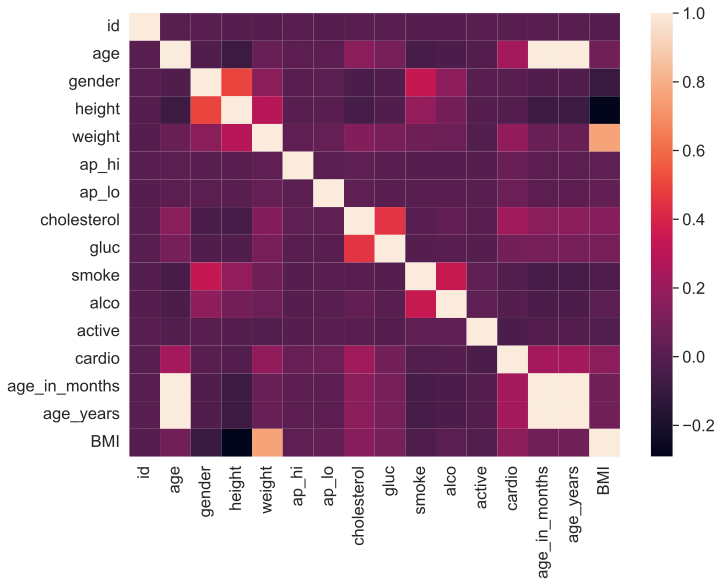

In [270]:


corr_matrixx = dataFrame.corr()
plot = sns.heatmap(corr_matrixx);
plot

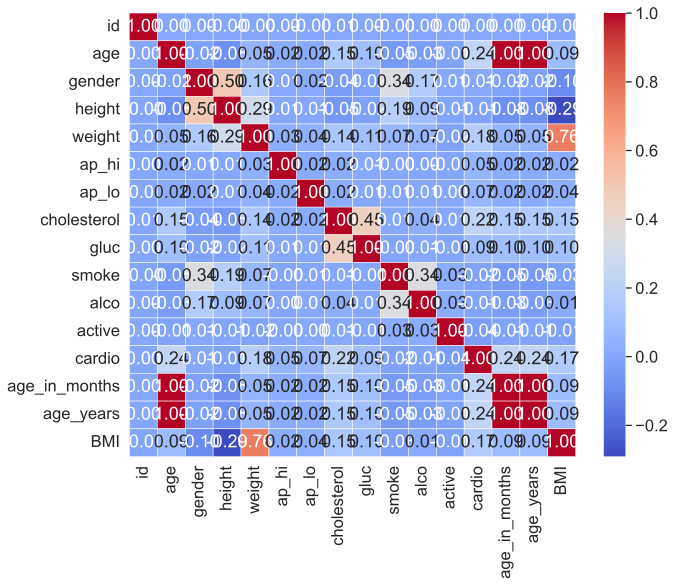

In [272]:
corr_matrix = dataFrame.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Find the correlation between gender and other features
gender_corr = corr_matrix['gender'].drop('gender')  # Exclude gender itself from the correlation

# Identify the pair with the strongest correlation
strongest_corr_feature = gender_corr.idxmax()  # Feature with the highest correlation
strongest_corr_value = gender_corr.max()

In [274]:
print(f"The feature with the strongest correlation with gender is: {strongest_corr_feature} with a correlation of {strongest_corr_value:.2f}")

The feature with the strongest correlation with gender is: height with a correlation of 0.50


In [276]:
#Height distribution of men and women


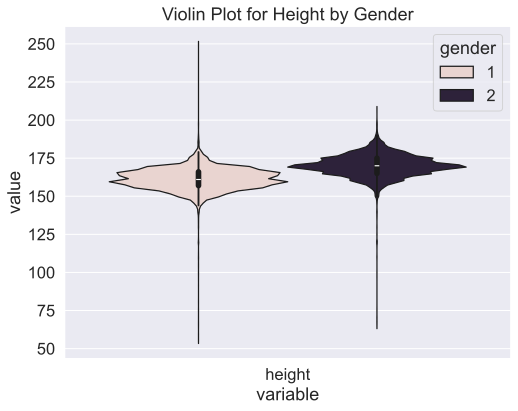

In [282]:
df_long = pd.melt(dataFrame, id_vars='gender', value_vars=['height'], var_name='variable', value_name='value')

plt.figure(figsize=(8, 6))
sns.violinplot(x='variable', y='value', hue='gender', data=df_long, density_norm='count')

# Display the plot
plt.title('Violin Plot for Height by Gender')
plt.show()

In [284]:
#solution 

In [288]:
dataFrame.groupby("gender")["height"].mean()

gender
1    161.355612
2    169.947895
Name: height, dtype: float64

In [290]:
# 1 female 2 male 
#45530 women и 24470 men.

In [292]:
dataFrame.groupby("gender")["alco"].mean()

gender
1    0.025500
2    0.106375
Name: alco, dtype: float64